<a href="https://colab.research.google.com/github/papajo/2015/blob/master/sliding_window.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Sliding Window in Time Series(Visualization)


Window 1: [1 2 3] → Predict next value
Window 2: [2 3 4] → Predict next value
Window 3: [3 4 5] → Predict next value
Window 4: [4 5 6] → Predict next value


/tmp/ipykernel_2340/1729339727.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('viridis', len(windows_info)) # Reverted to avoid ModuleNotFoundError


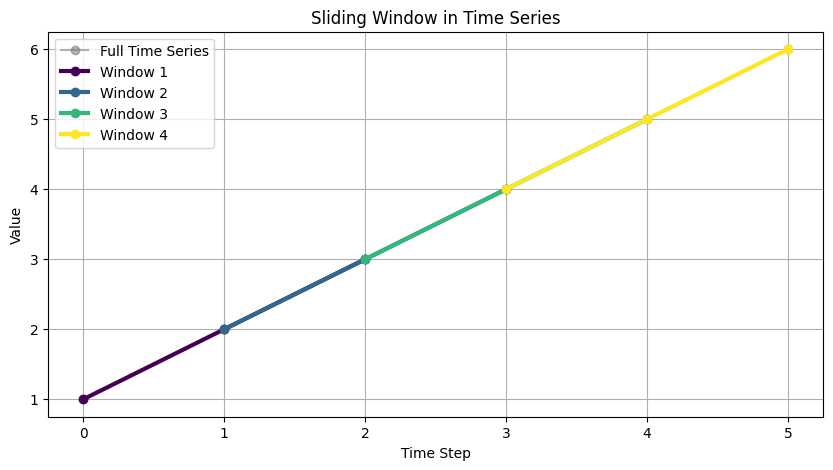

In [7]:
import matplotlib.pyplot as plt
import numpy as np

# Time series data
data = np.arange(1, 7)  # [1, 2, 3, 4, 5, 6]
window_size = 3
stride = 1

# Generate sliding windows and store their start indices
windows_info = []
for i in range(0, len(data) - window_size + 1, stride):
    window = data[i:i+window_size]
    windows_info.append((i, window))
    print(f"Window {i//stride + 1}: {window} → Predict next value")

# Plotting
plt.figure(figsize=(10, 5))

# Plot the entire time series data
plt.plot(range(len(data)), data, 'o-', color='gray', label='Full Time Series', alpha=0.6)

# Get a colormap for distinct window colors
colors = plt.cm.get_cmap('viridis', len(windows_info)) # Reverted to avoid ModuleNotFoundError

for idx, (start_idx, window) in enumerate(windows_info):
    # Plot each window segment, highlighting it on the full time series
    plt.plot(range(start_idx, start_idx + window_size), window,
             marker='o', linestyle='-', linewidth=3,
             color=colors(idx), label=f'Window {idx+1}')

plt.title("Sliding Window in Time Series")
plt.xlabel("Time Step")
plt.ylabel("Value")
plt.xticks(range(len(data))) # Ensure x-axis ticks align with data points
plt.legend()
plt.grid(True)
plt.show()

In [17]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
from IPython.display import HTML

# --- Real-world-like Time series data (synthetic) ---
# Generating a longer, more complex sequence:
# A base trend, a cyclical component (like seasonality), and some random noise.
np.random.seed(42) # for reproducibility
time_steps = np.arange(100) # 100 data points

# Base trend
trend = 0.1 * time_steps

# Cyclical component (e.g., daily/weekly cycles)
seasonal = 10 * np.sin(time_steps / 10) + 5 * np.cos(time_steps / 5)

# Noise
noise = np.random.normal(0, 2, len(time_steps))

data = trend + seasonal + noise # Combine components

window_size = 10 # Adjusted window size for larger data
stride = 1

# Create the figure and axis for the animation
fig, ax = plt.subplots(figsize=(12, 6))
ax.set_xlim(-0.5, len(data) - 0.5) # Extend limits slightly for better visualization
ax.set_ylim(min(data) - 5, max(data) + 5) # Adjusted ylim for new data range
ax.set_xlabel("Time Step")
ax.set_ylabel("Value")
ax.set_title("Animated Sliding Window in Time Series (Real-world-like Data)")
ax.grid(True)

# Plot the full time series data as a background
ax.plot(range(len(data)), data, 'o--', color='gray', label='Full Time Series', alpha=0.6)

# Initialize the line for the sliding window
line, = ax.plot([], [], 'o-', color='red', linewidth=3, label='Current Window')
window_text = ax.text(0.05, 0.9, '', transform=ax.transAxes, fontsize=12, verticalalignment='top')

# Function to initialize the animation
def init():
    line.set_data([], [])
    window_text.set_text('')
    return line, window_text,

# Function to update the animation frame
def update(frame):
    start_idx = frame * stride
    if start_idx + window_size > len(data):
        # This ensures we don't go out of bounds for the last window
        start_idx = len(data) - window_size # Adjust start_idx to ensure full window
        if start_idx < 0: # Handle cases where data is too small for window
            start_idx = 0

    current_window = data[start_idx : start_idx + window_size]
    x_data = range(start_idx, start_idx + window_size)
    y_data = current_window

    mean_value = np.mean(current_window)

    description = "" # Initialize description
    if frame == 0:
        description = "First window: Extracting initial segment for analysis."
    elif frame == num_frames - 1: # Check for the last frame using num_frames
        description = "Last window: Capturing the final segment of the time series."
    else:
        description = "Window slides to capture new, sequential data points."

    line.set_data(x_data, y_data)
    window_text.set_text(f'Window {frame + 1}: {np.round(current_window, 2)}\nMean: {mean_value:.2f}\n{description}')
    return line, window_text,

# Calculate the number of frames needed
num_frames = (len(data) - window_size) // stride + 1
if num_frames < 1: # Ensure at least one frame if data is too short
    num_frames = 1

# Create the animation
ani = animation.FuncAnimation(fig, update, frames=num_frames,
                              init_func=init, blit=True, repeat=False, interval=300)

# Display the animation
plt.close(fig) # Close the plot to prevent it from showing as a static image
HTML(ani.to_jshtml())

# 2. Sliding Window in Text (N-grams)

In [18]:
import pandas as pd

# Example text
text = "The cat sat on the mat".split()  # Split into words
n = 2  # Bigrams

# Generate n-grams
ngrams = [text[i:i+n] for i in range(len(text) - n + 1)]

# Display as a table
df = pd.DataFrame(ngrams, columns=["Word 1", "Word 2"], index=range(1, len(ngrams)+1))
print("Bigrams (Sliding Window of Size 2):")
print(df)


Bigrams (Sliding Window of Size 2):
  Word 1 Word 2
1    The    cat
2    cat    sat
3    sat     on
4     on    the
5    the    mat


In [19]:
from IPython.display import HTML, display

def highlight_ngram(text_list, n, current_ngram_idx):
    highlighted_text = []
    for i, word in enumerate(text_list):
        if i >= current_ngram_idx and i < current_ngram_idx + n:
            highlighted_text.append(f'<span style="background-color: yellow;">{word}</span>')
        else:
            highlighted_text.append(word)
    return ' '.join(highlighted_text)

text = "The cat sat on the mat".split()
n = 2  # Bigrams

print("Visualizing Bigrams (Sliding Window of Size 2):")

html_output = []
for i in range(len(text) - n + 1):
    ngram = text[i:i+n]
    highlighted = highlight_ngram(text, n, i)
    html_output.append(f'<p><b>Window {i+1}:</b> {highlighted} (ngram: {ngram})</p>')

display(HTML(''.join(html_output)))

Visualizing Bigrams (Sliding Window of Size 2):


# 3. Sliding Window in Images (CNN Filter Concept)


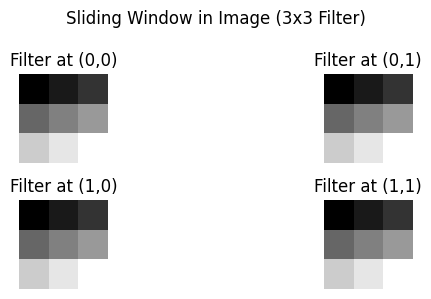

In [3]:
import matplotlib.pyplot as plt
import numpy as np

# 4x4 image and 3x3 filter
image = np.array([[1, 2, 3, 4],
                  [5, 6, 7, 8],
                  [9,10,11,12],
                  [13,14,15,16]])

filter_size = 3
stride = 1

# Visualize filter positions
plt.figure(figsize=(8, 3))
for i in range(0, image.shape[0] - filter_size + 1, stride):
    for j in range(0, image.shape[1] - filter_size + 1, stride):
        window = image[i:i+filter_size, j:j+filter_size]
        plt.subplot(2, 2, (i//stride)*2 + j//stride + 1)
        plt.imshow(window, cmap='gray')
        plt.title(f"Filter at ({i},{j})")
        plt.axis('off')
plt.suptitle("Sliding Window in Image (3x3 Filter)")
plt.tight_layout()
plt.show()


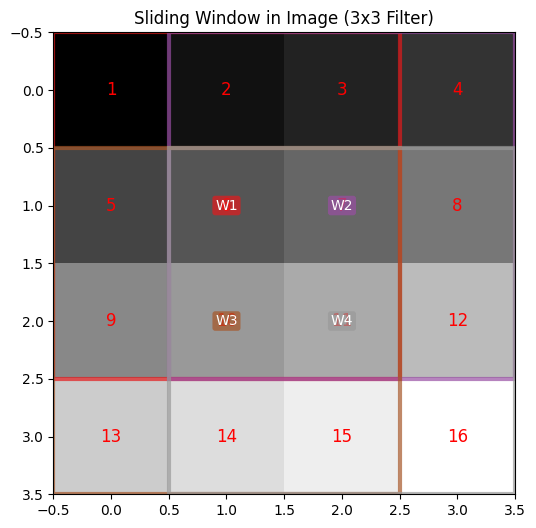

In [13]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as patches

# 4x4 image and 3x3 filter
image = np.array([[ 1,  2,  3,  4],
                  [ 5,  6,  7,  8],
                  [ 9, 10, 11, 12],
                  [13, 14, 15, 16]])

filter_size = 3
stride = 1

fig, ax = plt.subplots(figsize=(6, 6))
ax.imshow(image, cmap='gray', origin='upper')

# Display values in cells
for (j,i),label in np.ndenumerate(image):
    ax.text(i,j,label,ha='center',va='center', color='red', fontsize=12)

ax.set_title("Sliding Window in Image (3x3 Filter)")
ax.set_xticks(np.arange(-.5, image.shape[1], 1), minor=True)
ax.set_yticks(np.arange(-.5, image.shape[0], 1), minor=True)
ax.grid(which="minor", color="black", linestyle='-', linewidth=2)
ax.tick_params(which="minor", size=0)

num_windows = 0
# Calculate the total number of possible windows to determine the number of colors needed
num_windows_possible = (image.shape[0] - filter_size + 1) * (image.shape[1] - filter_size + 1)
# Get the colormap and generate a discrete set of colors
cmap = plt.colormaps.get_cmap('Set1') # Get the colormap object
colors_list = [cmap(i) for i in np.linspace(0, 1, num_windows_possible)] # Generate colors

for i in range(0, image.shape[0] - filter_size + 1, stride):
    for j in range(0, image.shape[1] - filter_size + 1, stride):
        # Create a Rectangle patch for the current window
        rect = patches.Rectangle((j - 0.5, i - 0.5), filter_size, filter_size, linewidth=3,
                                 edgecolor=colors_list[num_windows], facecolor='none', alpha=0.7) # Use colors from the list
        ax.add_patch(rect)
        ax.text(j + filter_size/2 - 0.5, i + filter_size/2 - 0.5,
                f'W{num_windows+1}', color='white', fontsize=10, ha='center', va='center',
                bbox=dict(facecolor=colors_list[num_windows], alpha=0.7, edgecolor='none', boxstyle='round,pad=0.2'))
        num_windows += 1

plt.show()

# 4. Recursion Visualization (Factorial Example)


In [4]:
def factorial(n, depth=0):
    print("  " * depth + f"factorial({n})")
    if n == 1:
        print("  " * depth + "return 1")
        return 1
    else:
        result = n * factorial(n-1, depth+1)
        print("  " * depth + f"return {result}")
        return result

# Run the recursive function
factorial(5)

factorial(5)
  factorial(4)
    factorial(3)
      factorial(2)
        factorial(1)
        return 1
      return 2
    return 6
  return 24
return 120


120

### Explanation of Recursion Output (Call Stack Visualization)

The output from the `factorial(5)` function clearly illustrates how recursion works by showing the 'call stack'. Each line with `  ` indentation represents a new function call being pushed onto the stack, and each `return` statement shows a function call being popped off the stack with its computed value.

Let's break down the execution for `factorial(5)`:

1.  **`factorial(5)`** is called.
    *   It prints `factorial(5)`. Since `5 != 1`, it proceeds to `5 * factorial(4)`.
    *   **`factorial(4)`** is called (pushed onto the stack).
        *   It prints `  factorial(4)`. Since `4 != 1`, it proceeds to `4 * factorial(3)`.
        *   **`factorial(3)`** is called (pushed onto the stack).
            *   It prints `    factorial(3)`. Since `3 != 1`, it proceeds to `3 * factorial(2)`.
            *   **`factorial(2)`** is called (pushed onto the stack).
                *   It prints `      factorial(2)`. Since `2 != 1`, it proceeds to `2 * factorial(1)`.
                *   **`factorial(1)`** is called (pushed onto the stack).
                    *   It prints `        factorial(1)`. Since `1 == 1`, it prints `        return 1` and returns `1`.
                *   `factorial(1)` is popped. `factorial(2)` now has `2 * 1`.
                *   It prints `      return 2` and returns `2`.
            *   `factorial(2)` is popped. `factorial(3)` now has `3 * 2`.
            *   It prints `    return 6` and returns `6`.
        *   `factorial(3)` is popped. `factorial(4)` now has `4 * 6`.
        *   It prints `  return 24` and returns `24`.
    *   `factorial(4)` is popped. `factorial(5)` now has `5 * 24`.
    *   It prints `return 120` and returns `120`.

This process shows how the function calls build up (deeper indentation) until the base case (`n=1`) is reached. Then, the results are calculated and returned step-by-step as the calls unwind (lesser indentation), until the initial call to `factorial(5)` finally returns the complete result.